In [1]:
import torch
import torch.nn as nn
from torchvision import transforms
from torch import optim as optim
from torch.utils.data import Dataset
import numpy as np
import matplotlib.pyplot as plt
import torchvision.utils as vutils
import matplotlib.animation as animation
from IPython.display import HTML
import pandas as pd
from skimage import io
import os

# Set random seed for reproducibility
manualSeed = 42
torch.manual_seed(manualSeed)

In [2]:
# Batch size during training
batch_size = 140

# Image size 
image_size = 32

# Number of channels in the training images. For black and white images this is 1.
nc = 1

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of y label vector
ny = 2

# Size of feature maps in discriminator
ngf = 32

# Size of feature maps in discriminator
ndf = 32

# Number of training epochs
num_epochs = 500

# Image saving interval
interval = 10

# Learning rate for optimizers
lr = 0.0002

# Beta hyperparams for Adam optimizers
beta = (0.5, 0.999)

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
class FontDataset(Dataset):

    def __init__(self, csv_file, root_dir, transform=None):
        self.fonts_frame = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.fonts_frame)
    
    def __getitem__(self, idx):
        img_path = os.path.join(self.root_dir, self.fonts_frame.iloc[idx, 0])

        image = io.imread(img_path)
        font_attributes = self.fonts_frame.iloc[idx, 1:]
        font_attributes = np.array([font_attributes])
        font_attributes = font_attributes.astype("int").reshape(-1, 3)

        if self.transform:
            image = self.transform(image)

        return image, font_attributes


In [5]:
data_loader = torch.utils.data.DataLoader(FontDataset(csv_file="A_1/Fonts.csv", 
                            root_dir="A_1/PNG/", 
                            transform=transforms.Compose([
                                transforms.ToPILImage(),
                                transforms.Pad(30, 255),
                                transforms.Resize(image_size),
                                transforms.CenterCrop(image_size),
                                transforms.ToTensor(),
                                transforms.Normalize(
                                 (0.5,), (0.5,))
                            ])),
  batch_size=batch_size, shuffle=True);

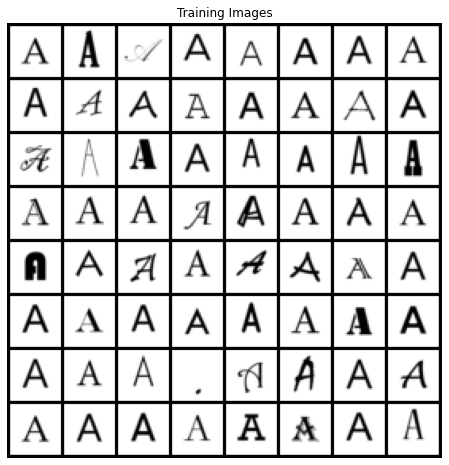

In [6]:
real_batch = next(iter(data_loader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

In [7]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [8]:
class GeneratorModel(nn.Module):
    def __init__(self):
        super(GeneratorModel, self).__init__()
        
        self.noise = nn.Sequential(
            # input size: 100 x 1 x 1
            nn.ConvTranspose2d(nz, ngf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True)
            # state size: 256 x 4 x 4
        )

        self.labels = nn.Sequential(
            # input size is 2 x 1 x 1
            nn.ConvTranspose2d(ny, ngf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True)
            # state size: 256 x 4 x 4
        )

        self.main = nn.Sequential(
            # input size is 512 x 4 x 4
            nn.ConvTranspose2d(ngf*16, ngf*8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True),
            # state size: 256 x 8 x 8

            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*4),
            nn.ReLU(True),
            # state size: 512 x 16 x 16

            nn.ConvTranspose2d(ngf*4, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )
        
    
    def forward(self, x, labels):
        x = self.noise(x)
        c = self.labels(labels)
        input = torch.cat([x, c], 1)
        
        return self.main(input).to(device)
       

In [9]:
class DiscriminatorModel(nn.Module):
    def __init__(self):
        super(DiscriminatorModel, self).__init__()

        self.data = nn.Sequential(
            # input size: 1 x 32 x 32
            nn.Conv2d(nc, ndf*2, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True)
            # output size: 64 x 16 x 16
        )

        self.labels = nn.Sequential(
            # input size: 2 x 32 x 32
            nn.Conv2d(ny, ndf*2, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True)
            # state size: 64 x 16 x 16
        )
       
        self.main = nn.Sequential(
           # input size: 128 x 16 x 16
           nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False),
           nn.BatchNorm2d(ndf*8),
           nn.LeakyReLU(0.2, inplace=True),
           # state size: 256 x 8 x 8
           
           nn.Conv2d(ndf*8, ndf*16, 4, 2, 1, bias=False),
           nn.BatchNorm2d(ndf*16),
           nn.LeakyReLU(0.2, inplace=True),
           # state size: 512 x 4 x 4

           nn.Conv2d(ndf*16, 1, 4, 1, 0, bias=False),
           nn.Sigmoid() 
       )

    def forward(self, x, labels):
        x = self.data(x)
        c = self.labels(labels)
        input = torch.cat([x, c], 1)


        return self.main(input).to(device)

In [10]:
generator = GeneratorModel().to(device)

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.02.
generator.apply(weights_init)

GeneratorModel(
  (noise): Sequential(
    (0): ConvTranspose2d(100, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (labels): Sequential(
    (0): ConvTranspose2d(2, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (main): Sequential(
    (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(128, 1, kernel_size=(4, 4), stride=(2, 2), padding=(

In [11]:
discriminator = DiscriminatorModel().to(device)

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.02.
discriminator.apply(weights_init)

DiscriminatorModel(
  (data): Sequential(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (labels): Sequential(
    (0): Conv2d(2, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (main): Sequential(
    (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (7): Sigmoid()
  )
)

In [12]:
criterion = nn.BCELoss()

optimizerG = optim.Adam(generator.parameters(), lr=lr, betas=beta)

optimizerD = optim.Adam(discriminator.parameters(), lr=lr, betas=beta)

# fixed noise & label
fixed_noise = torch.randn(ny, nz)
zeros = torch.zeros(64, 1)
ones = torch.ones(64, 1)
fixed_label = torch.cat([zeros, ones], 0)

for i in range(31):
    temp_noise = torch.randn(ny, nz)
    fixed_noise = torch.cat([fixed_noise, temp_noise], 0)
 
fixed_noise = fixed_noise.view(-1, nz, 1, 1).to(device)
fixed_label = fixed_label.view(-1, ny, 1, 1).to(device)

In [13]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

# label preprocess
onehot = torch.eye(ny, ny).view(ny, ny, 1, 1)
fill = torch.zeros([ny, ny, image_size, image_size])
for i in range(ny):
    fill[i, i, :, :] = 1

for epoch in range(num_epochs):
    for i, data in enumerate(data_loader):

        ##################################
        # (1) Update Discriminator network
        ##################################

        ## Train with all-real batch
        discriminator.zero_grad()       
        # image data
        b_size = data[0].size()[0]
        real_data = data[0].to(device)
        real_style = data[1].squeeze()[:, 0].to(device).type(torch.LongTensor)
        # labels
        y_real = torch.ones(b_size).to(device)
        y_fake = torch.zeros(b_size).to(device)
        y_fill = fill[real_style].to(device)
        # Forward pass real batch through D
        output = discriminator(real_data, y_fill).squeeze()
        # Calculate loss on all-real batch
        errD_real = criterion(output, y_real)


        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn((b_size,nz)).view(-1, nz, 1, 1).to(device)
        # Generate batch of fake digits
        fake_style = torch.randint(0, ny, (b_size,)).to(device)
        y_label = onehot[fake_style].to(device)
        y_fill = fill[fake_style].to(device)
        # Generate fake image batch with G
        fake_data = generator(noise, y_label)
        # Forward pass fake btach through D
        output = discriminator(fake_data.detach(), y_fill).squeeze()
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, y_fake)
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Calculate gradients for D in backward pass
        errD.backward()
        # Update D
        optimizerD.step()

        ##################################
        # (2) Update G network
        ##################################

        generator.zero_grad()
        # # Generate batch of latent vectors
        noise = torch.randn((b_size,nz)).view(-1, nz, 1, 1).to(device)
        # Generate batch of fake digits
        fake_style = torch.randint(0, ny, (b_size,)).to(device)
        y_label = onehot[fake_style].to(device)
        y_fill = fill[fake_style].to(device)
        # Generate fake image batch with G
        fake_data = generator(noise, y_label)
        # Forward pass fake btach through D
        output = discriminator(fake_data, y_fill).squeeze()
        # Calculate G's loss based on this output
        errG = criterion(output, y_real)
        # Calculate gradients for G
        errG.backward()
        # Update G
        optimizerG.step()
        
       # Output training stats 
        if i % len(data_loader) == 0:
            print(f"[{epoch+1}/{num_epochs}] \tLoss_D: {errD.item():.4f}\t Loss_G: {errG.item():.4f}")

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed noise
        if (epoch % interval == 0) and (i % len(data_loader) == 0):
            with torch.no_grad():
                fake = generator(fixed_noise, fixed_label).detach().view(-1, 1, image_size, image_size).to(device)
            img_list.append(vutils.make_grid(fake, normalize=True))
            
        iters += 1

[1/500] 	Loss_D: 2.0207	 Loss_G: 6.9717
[2/500] 	Loss_D: 1.4601	 Loss_G: 7.1750
[3/500] 	Loss_D: 1.0592	 Loss_G: 9.1279
[4/500] 	Loss_D: 0.4949	 Loss_G: 6.5762
[5/500] 	Loss_D: 0.5441	 Loss_G: 5.4677
[6/500] 	Loss_D: 0.5768	 Loss_G: 7.2752
[7/500] 	Loss_D: 0.4244	 Loss_G: 6.1318
[8/500] 	Loss_D: 0.4048	 Loss_G: 6.2699
[9/500] 	Loss_D: 0.3958	 Loss_G: 4.9198
[10/500] 	Loss_D: 0.2914	 Loss_G: 7.1790
[11/500] 	Loss_D: 0.2352	 Loss_G: 4.7673
[12/500] 	Loss_D: 0.2457	 Loss_G: 6.8075
[13/500] 	Loss_D: 0.2342	 Loss_G: 4.8088
[14/500] 	Loss_D: 0.1823	 Loss_G: 6.1257
[15/500] 	Loss_D: 0.1420	 Loss_G: 4.2474
[16/500] 	Loss_D: 0.2514	 Loss_G: 8.8519
[17/500] 	Loss_D: 1.0689	 Loss_G: 0.0689
[18/500] 	Loss_D: 5.1311	 Loss_G: 13.0853
[19/500] 	Loss_D: 2.2237	 Loss_G: 12.0100
[20/500] 	Loss_D: 0.3888	 Loss_G: 5.5774
[21/500] 	Loss_D: 0.7663	 Loss_G: 6.5651
[22/500] 	Loss_D: 0.4456	 Loss_G: 9.1869
[23/500] 	Loss_D: 0.9061	 Loss_G: 1.5418
[24/500] 	Loss_D: 1.6731	 Loss_G: 12.1141
[25/500] 	Loss_D: 3.67

[199/500] 	Loss_D: 0.3363	 Loss_G: 5.5594
[200/500] 	Loss_D: 0.1218	 Loss_G: 4.3886
[201/500] 	Loss_D: 0.1582	 Loss_G: 4.8666
[202/500] 	Loss_D: 0.1078	 Loss_G: 4.6012
[203/500] 	Loss_D: 0.1245	 Loss_G: 5.0643
[204/500] 	Loss_D: 0.1859	 Loss_G: 4.6828
[205/500] 	Loss_D: 0.1670	 Loss_G: 3.9581
[206/500] 	Loss_D: 0.1915	 Loss_G: 4.8445
[207/500] 	Loss_D: 0.1305	 Loss_G: 4.4535
[208/500] 	Loss_D: 0.0844	 Loss_G: 4.5966
[209/500] 	Loss_D: 0.3048	 Loss_G: 6.5012
[210/500] 	Loss_D: 0.1886	 Loss_G: 6.3186
[211/500] 	Loss_D: 0.1310	 Loss_G: 4.5548
[212/500] 	Loss_D: 0.3056	 Loss_G: 6.2295
[213/500] 	Loss_D: 0.1669	 Loss_G: 5.5511
[214/500] 	Loss_D: 0.1007	 Loss_G: 3.9429
[215/500] 	Loss_D: 0.0857	 Loss_G: 3.0111
[216/500] 	Loss_D: 0.1682	 Loss_G: 4.0653
[217/500] 	Loss_D: 0.1257	 Loss_G: 5.2624
[218/500] 	Loss_D: 0.1264	 Loss_G: 5.1841
[219/500] 	Loss_D: 0.0996	 Loss_G: 3.2008
[220/500] 	Loss_D: 0.1557	 Loss_G: 5.3796
[221/500] 	Loss_D: 0.1251	 Loss_G: 5.5126
[222/500] 	Loss_D: 0.0943	 Loss_G:

[394/500] 	Loss_D: 0.9982	 Loss_G: 4.8215
[395/500] 	Loss_D: 0.6227	 Loss_G: 4.1239
[396/500] 	Loss_D: 0.5124	 Loss_G: 3.3746
[397/500] 	Loss_D: 0.4467	 Loss_G: 3.3964
[398/500] 	Loss_D: 0.3886	 Loss_G: 4.6775
[399/500] 	Loss_D: 0.2906	 Loss_G: 3.4069
[400/500] 	Loss_D: 0.2426	 Loss_G: 2.9971
[401/500] 	Loss_D: 0.2666	 Loss_G: 3.6642
[402/500] 	Loss_D: 0.3096	 Loss_G: 2.5868
[403/500] 	Loss_D: 0.2253	 Loss_G: 2.0196
[404/500] 	Loss_D: 0.5423	 Loss_G: 5.1444
[405/500] 	Loss_D: 0.6769	 Loss_G: 2.9811
[406/500] 	Loss_D: 0.3282	 Loss_G: 3.9060
[407/500] 	Loss_D: 0.4339	 Loss_G: 4.7369
[408/500] 	Loss_D: 0.4601	 Loss_G: 3.2620
[409/500] 	Loss_D: 0.2748	 Loss_G: 2.5594
[410/500] 	Loss_D: 0.4375	 Loss_G: 4.4100
[411/500] 	Loss_D: 0.6015	 Loss_G: 2.7630
[412/500] 	Loss_D: 0.3115	 Loss_G: 3.1309
[413/500] 	Loss_D: 0.1674	 Loss_G: 2.2410
[414/500] 	Loss_D: 0.1992	 Loss_G: 2.9449
[415/500] 	Loss_D: 0.2753	 Loss_G: 3.8742
[416/500] 	Loss_D: 0.2247	 Loss_G: 2.3667
[417/500] 	Loss_D: 0.1612	 Loss_G:

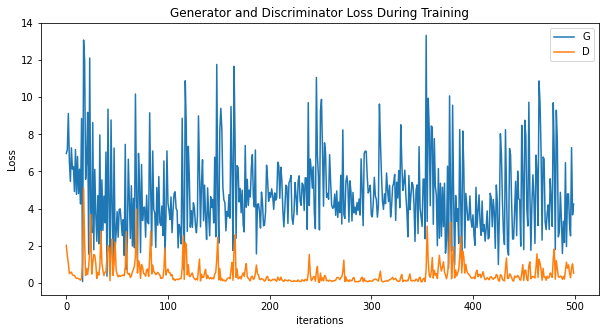

In [14]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

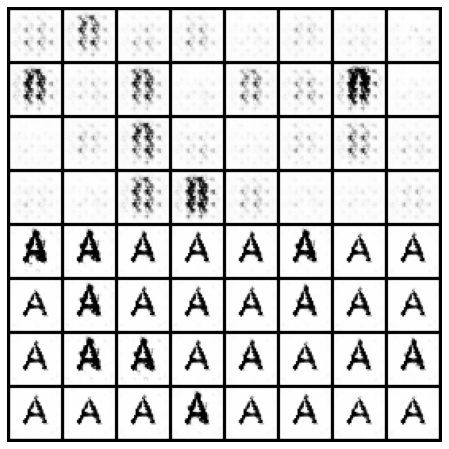

In [15]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i.cpu(),(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

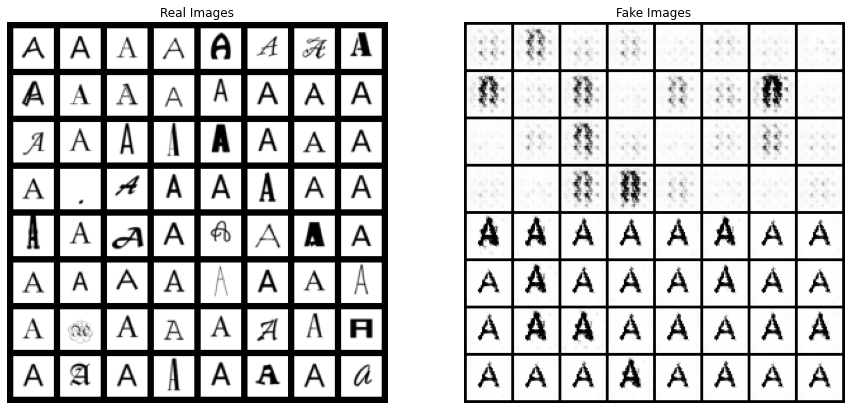

In [16]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(data_loader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1].cpu(),(1,2,0)))
plt.show()

In [17]:
torch.save(generator.state_dict(), "models/Generator_cDCGAN_Fonts")
torch.save(discriminator.state_dict(), "models//Discriminator_cDCGAN_Fonts")

In [18]:
generator = GeneratorModel()
generator.load_state_dict(torch.load("models/Generator_cDCGAN_Fonts"))

discriminator = DiscriminatorModel()
discriminator.load_state_dict(torch.load("models/Discriminator_cDCGAN_Fonts"))

<All keys matched successfully>